In [27]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from rclpy.serialization import deserialize_message
from rosidl_runtime_py import message_to_csv
from sensor_msgs.msg import Image
from rosbag2_py import SequentialReader, StorageOptions, ConverterOptions
from cv_bridge import CvBridge
from matplotlib import font_manager
from scipy.interpolate import BSpline
from dynus_interfaces.msg import YawOutput
from std_msgs.msg import Header
from dynus_interfaces.msg import DynTraj
import pandas as pd
from os import listdir
from os.path import isfile, join
import yaml
bridge = CvBridge()

# Font settings
font = font_manager.FontProperties()
font.set_family('serif')
plt.rcParams.update({"text.usetex": True})
plt.rcParams["font.family"] = "Times New Roman"
font.set_size(40)


In [28]:
# Get the dict of parameters from the yaml file
parameters_path = "/home/kkondo/code/dynus_ws/src/dynus/config/dynus.yaml"
with open(parameters_path, 'r') as file:
    parameters = yaml.safe_load(file)

# Extract specific node parameters
parameters = parameters['dynus_node']['ros__parameters']
w_max = parameters['w_max']

In [29]:
# Define the file path
base_folder_path = "/media/kkondo/T7/dynus/tro_paper/single_agent_performance"

In [30]:
def get_header_initialized_dict(file, algo_folder_path):

    dict = {}

    # Print the file path
    file_path = algo_folder_path + "/" + file

    # Load the CSV file
    raw_data = pd.read_csv(file_path)

    # Get headers
    headers = raw_data.columns
    
    # Initialize the dictionary
    for header in headers:
        dict[header] = []

    return dict

def get_data(folder_path, algorithm):

    """
    Get the data from the CSV files in the folder
    """
    
    # Get the files in the folder
    algo_folder_path = folder_path + algorithm

    # Get all the CSV files in the folder
    files = [f for f in listdir(algo_folder_path) if isfile(join(algo_folder_path, f))]
    
    # Initialize the dictionary to store the data
    float_data = get_header_initialized_dict(files[0], algo_folder_path)

    # Convert the data to float
    for file in files:

        # Print the file path
        file_path = algo_folder_path + "/" + file

        # Load the CSV file
        raw_data = pd.read_csv(file_path)

        # Get headers
        headers = raw_data.columns

        raw_data_dict = {}
        for header in headers:
            raw_data_dict[header] = None

        # Store the data in the dictionary
        for header in headers:
            raw_data_dict[header] = raw_data[header].values

        for key in raw_data_dict:
            if key == 'Planner':
                continue
            float_data[key].extend(raw_data_dict[key].astype(float).tolist())
    
            # If there's any nan data - FASTER approach sometimes have nan values in Dynamic A* - remove them
            if (np.isnan(float_data[key]).any()):
                float_data[key] = [x for x in float_data[key] if not np.isnan(x)] 

    return float_data

def get_metrics(float_data):
    """
    Get the average, min, max, and std of the data
    """

    # Initialize the dictionary
    avg_data = {}
    min_data = {}
    max_data = {}
    std_data = {}

    # Get average, min, max, and std of the data
    for key in float_data:

        if key == 'Planner':
            continue

        avg_data[key] = np.mean(float_data[key])
        min_data[key] = np.min(float_data[key])
        max_data[key] = np.max(float_data[key])
        std_data[key] = np.std(float_data[key])

    return avg_data, min_data, max_data, std_data

def filter_data(data):

    # Cost (final node's g): if global planning time is 0.0 and the result is 0, then it's after reaching the goal
    failure_indices = [i for i, x in enumerate(data["Global Planning Time [ms]"]) if x == 0.0 and data['Result'][i] == 0]

    print("failure indices: ", failure_indices)

    # Filter out the failures
    
    # Get the keys
    keys = list(data.keys())
    for key in keys:
        data[key] = [x for i, x in enumerate(data[key]) if i not in failure_indices]

    return data


In [31]:
# Get the data
Ns = [3]
topic_name = "/NX01/goal"
message_type = "dynus_interfaces/msg/Goal"  # Update with your message type
constraints = ["hard_constr_for_final_state"]
num_bags = 1
env = "dynamic_forest3"

for N in range(Ns[0], Ns[-1] + 1):

    for constraint in constraints:

        algorithms = ["dynus"]

        for algorithm in algorithms:


                    folder_path = f"{base_folder_path}/{env}/csv/"
                    print("folder_path", folder_path)

                    print("**************************************************************************************************************")
                    print(f"N = {N}, constraint = {constraint}, constraint = {constraint}, algorithm = {algorithm}")
                    print("**************************************************************************************************************")

                    try:
                        float_data = get_data(folder_path, algorithm)
                    except:
                        print(f"No data for N = {N}, constraint = {constraint}, algorithm = {algorithm}")
                        continue
                    float_data = filter_data(float_data)
                    avg_data, min_data, max_data, std_data = get_metrics(float_data)

                    for key in float_data:
                        if key == 'Planner':
                            continue

                        print(key, avg_data[key], min_data[key], max_data[key], std_data[key])

folder_path /media/kkondo/T7/dynus/tro_paper/single_agent_performance/dynamic_forest3/csv/
**************************************************************************************************************
N = 3, constraint = hard_constr_for_final_state, constraint = hard_constr_for_final_state, algorithm = dynus
**************************************************************************************************************
failure indices:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 194, 198, 199, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 3

In [9]:
# Function to process a single bag folder and accumulate data after receiving term_goal
def process_bag_folder_with_trigger(bag_folder, depth_topic, term_goal_topic, accumulated_heatmap, frame_count):
    storage_options = StorageOptions(
        uri=bag_folder,
        storage_id='sqlite3',
    )
    converter_options = ConverterOptions(
        input_serialization_format='cdr',
        output_serialization_format='cdr',
    )
    reader = SequentialReader()
    reader.open(storage_options, converter_options)
    cbar_ax2, orientation='horizontal')
    # cbar.ax.set_facecolor('white')  # Set the background color of the colorbar
    # # cbar.set_label("Traj. Velocity [m/s]", fontproperties=font, labelpad=0, color='white')
    # ax2.text(0.4, 0.12, "[m/s]", ha='center', va='top', transform=ax2.transAxes, fontproperties=font, color='white')
    # cbar.set_ticks([0.0, 1.0, 2.0, 3.0])
    # cbar.ax.set_xticklabels([0.0, 1.0, 2.0, 3.0], fontproperties=font)
    # cbar.ax.xaxis.set_tick_params(color='white', labelcolor='white')
    
    # Ensure necessary topics are present
    if depth_topic not in topic_map or term_goal_topic not in topic_map:
        print(f"Required topics not found in {bag_folder}. Skipping.")
        return accumulated_heatmap, frame_count

    # Initialize variables
    started = False  # Flag to start processing depth images

    # Read messages from the bag
    while reader.has_next():
        (topic, msg, t) = reader.read_next()
        if topic == term_goal_topic and not started:
            # Received term_goal; start processing depth images
            started = True
            print(f"Received {term_goal_topic} in {bag_folder}, starting heatmap accumulation.")
        
        if topic == depth_topic and started:
            # Deserialize and convert the ROS2 message to an OpenCV image
            depth_msg = deserialize_message(msg, Image)
            depth_image = bridge.imgmsg_to_cv2(depth_msg, desired_encoding="passthrough")
            
            # Handle NaNs or invalid depth values
            depth_image = np.nan_to_num(depth_image, nan=0.0, posinf=0.0, neginf=0.0)
            
            # Generate grayscale intensity map
            depth_normalized = cv2.normalize(depth_image, None, 0, 1, cv2.NORM_MINMAX)
            intensity_map = (depth_normalized * 255).astype(np.uint8)
            
            # Accumulate intensity maps
            if accumulated_heatmap is None:
                accumulated_heatmap = np.zeros_like(intensity_map, dtype=np.float32)
            accumulated_heatmap += intensity_map
            frame_count += 1

    return accumulated_heatmap, frame_count

# Main function to process all bag folders
def process_all_bag_folders_with_trigger(bag_root_folder, depth_topic, term_goal_topic, output_file):
    accumulated_heatmap = None
    frame_count = 0

    # Loop through each subfolder in the bag directory
    for subfolder in sorted(os.listdir(bag_root_folder)):
        bag_folder = os.path.join(bag_root_folder, subfolder)
        if os.path.isdir(bag_folder):
            print(f"Processing bag folder: {bag_folder}")
            accumulated_heatmap, frame_count = process_bag_folder_with_trigger(
                bag_folder, depth_topic, term_goal_topic, accumulated_heatmap, frame_count
            )

    # Save the final accumulated heatmap
    if accumulated_heatmap is not None and frame_count > 0:
        # Normalize accumulated heatmap to [0, 255]
        accumulated_heatmap_normalized = cv2.normalize(
            accumulated_heatmap, None, 0, 255, cv2.NORM_MINMAX
        ).astype(np.uint8)
        
        # Apply a colormap to the accumulated heatmap
        final_heatmap = cv2.applyColorMap(accumulated_heatmap_normalized, cv2.COLORMAP_JET)
        
        # Add a white box at the center of the heatmap
        height, width = final_heatmap.shape[:2]
        box_size = int(min(height, width) * 0.5)  # 50% of the image size
        top_left = ((width - box_size) // 2, (height - box_size) // 2)
        bottom_right = ((width + box_size) // 2, (height + box_size) // 2)
        cv2.rectangle(final_heatmap, top_left, bottom_right, (255, 255, 255), thickness=2, lineType=cv2.LINE_AA)

        # Save the final heatmap
        cv2.imwrite(output_file, final_heatmap)
        print(f"Saved final accumulated heatmap: {output_file}")


IndentationError: unindent does not match any outer indentation level (<tokenize>, line 69)

In [3]:
# Heatmap generation for all algorithms and envs

algorithms = ["dynus", "faster"]
envs = ["forest3"]

for env in envs:
    for algorithm in algorithms:

        # Set input and output paths
        bag_root_folder = f"/media/kkondo/T7/dynus/tro_paper/single_agent_performance/{env}/bags/{algorithm}"
        depth_topic = "/NX01/d435/depth/image_raw"
        term_goal_topic = "/NX01/term_goal"
        output_file = f"/media/kkondo/T7/dynus/tro_paper/single_agent_performance/{env}/heatmap/{algorithm}/final_heatmap.png"

        # Make sure the output directory exists
        os.makedirs(os.path.dirname(output_file), exist_ok=True)

        # Process all bag folders and generate a single heatmap
        process_all_bag_folders_with_trigger(bag_root_folder, depth_topic, term_goal_topic, output_file)

FileNotFoundError: [Errno 2] No such file or directory: '/media/kkondo/T7/dynus/tro_paper/single_agent_performance/forest3/bags/dynus'

In [4]:
def create_combined_heatmap_plot_2x2(heatmap_files, output_file):
    """
    Creates a single figure with four subfigures (heatmaps) in a 2x2 configuration
    with shared row titles, individual titles below images, and a shared colorbar.

    Parameters:
        heatmap_files (list of str): List of paths to the heatmap image files.
        output_file (str): Path to save the combined image.
    """
    # Create a 2x2 grid of subplots
    figsize_y = 15
    figsize_x = figsize_y / 1.618 + 6 # Golden ratio
    fig, axs = plt.subplots(2, 2, figsize=(figsize_x, figsize_y))

    # Initialize the colormap and shared colorbar range
    cmap = 'jet'
    vmin, vmax = 0, 255  # Adjust these limits if needed for your data

    # Titles for individual images
    individual_titles = [["DYNUS", "Only DOM"], ["DYNUS", "Only DOM"]]

    # Titles for rows
    row_titles = ["Benchmark 1", "Benchmark 2"]

    # Flatten axs for easier iteration
    axs = axs.flatten()

    # Plot each heatmap
    for i, heatmap_file in enumerate(heatmap_files):
        heatmap = plt.imread(heatmap_file)
        im = axs[i].imshow(heatmap, cmap=cmap, vmin=vmin, vmax=vmax)
        axs[i].axis('off')  # Remove axes for a cleaner look

        # Add titles below each subplot
        axs[i].set_title(individual_titles[i // 2][i % 2], fontproperties=font)
        # x_pos = axs[i].get_position().x0 + axs[i].get_position().width / 2
        # y_pos = axs[i].get_position().y0 - 0.02

        # if i % 2 == 0:
        #     x_pos -= 0.05
        # else:
        #     x_pos += 0.03
            
        # if i >= 2:
        #     y_pos += 0.05

        # fig.text(x_pos, y_pos, individual_titles[i // 2][i % 2], ha='center', va='center', fontproperties=font)

    # Add shared row titles
    for i, row_title in enumerate(row_titles):
        fig.text(0.5, 0.97 - i * 0.48, row_title, ha='center', va='center', fontproperties=font, fontsize=50)

    # Hide any unused subplots
    for j in range(len(heatmap_files), 4):
        axs[j].axis('off')

    # Add a shared colorbar below all subplots
    fig.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.05)
    cbar_ax = fig.add_axes([0.1, 0.04, 0.8, 0.03])  # [left, bottom, width, height]
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
    cbar.set_label("Obstacle Tracking Intensity", fontproperties=font)
    cbar.set_ticks([])
    
    # Save the combined figure
    plt.tight_layout()
    plt.savefig(output_file, format='pdf', dpi=300)
    plt.close(fig)
    print(f"Saved combined heatmap image: {output_file}")

In [ ]:
# Heatmap combined plot for all algorithms and benchmarks
heatmap_files = [
    "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/forest3/heatmap/dynus/final_heatmap.png",
    "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/forest3/heatmap/faster/final_heatmap.png",
    "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/forest3/heatmap/dynus/final_heatmap.png",
    "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/forest3/heatmap/faster/final_heatmap.png",
]
output_file = "/media/kkondo/T7/dynus/tro_paper/single_agent_performance/combined_heatmap.pdf"
create_combined_heatmap_plot_2x2(heatmap_files, output_file)

/tmp/ipykernel_772608/4063182353.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Saved combined heatmap image: /media/kkondo/T7/dynus/tro_paper/yaw_optimization/combined_heatmap.pdf


In [ ]:
def reconstruct_bspline_and_derivative(control_points, knots, degree=3, num_points=1000):
    t_min = knots[degree]  # Start time (valid knots)
    t_max = knots[-(degree + 1)]  # End time
    time_values = np.linspace(t_min, t_max, num_points)

    # Create B-spline object
    b_spline = BSpline(knots, control_points, degree)
    b_spline_values = b_spline(time_values)

    # Derivative of the B-spline
    b_spline_derivative = b_spline.derivative()
    b_spline_derivative_values = b_spline_derivative(time_values)

    return time_values, b_spline_values, b_spline_derivative_values

def plot_yaw_data_with_derivative(header, sequence, control_points, knots, output_file):
    time_values, b_spline_values, b_spline_derivative_values = reconstruct_bspline_and_derivative(control_points, knots)
    sequence_time = np.linspace(0, time_values[-1], len(sequence))

    figsize_x = 20
    figsize_y = figsize_x / 1.618  # Golden ratio
    fig, axs = plt.subplots(2, 1, figsize=(figsize_x, figsize_y), sharex=True)

    # Plot Yaw
    axs[0].scatter(sequence_time, sequence, color="red", label="Raw Yaw Sequence", zorder=10, s=200)
    axs[0].plot(time_values, b_spline_values, label="B-spline Result", linewidth=5, color='green')
    axs[0].set_title("Yaw Sequence and B-spline Fitting", fontproperties=font)
    axs[0].set_ylabel("Yaw [rad]", fontproperties=font)
    # axs[0].tick_params(axis='both')
    # axs[0].set_yticklabels(axs[0].get_yticks(), fontproperties=font)
    axs[0].legend(prop=font)
    axs[0].grid(True)

    # Plot Derivative (Yaw Rate)
    axs[1].plot(time_values, b_spline_derivative_values, label="B-spline Derivative", linewidth=5, color='green')
    axs[1].axhline(w_max, color='r', linestyle='--', linewidth=2, label="Yaw Rate Limits")
    axs[1].axhline(-w_max, color='r', linestyle='--', linewidth=2)
    axs[1].set_title("Yaw Rate (B-spline Derivative)", fontproperties=font)
    axs[1].set_xlabel("Time [s]", fontproperties=font)
    axs[1].set_ylabel("Yaw Rate [rad/s]", fontproperties=font)
    axs[1].tick_params(axis='both')
    # axs[1].set_xticklabels(axs[1].get_xticks(), fontproperties=font)
    # axs[1].set_yticklabels(axs[1].get_yticks(), fontproperties=font)
    axs[1].legend(prop=font)
    axs[1].grid(True)

    plt.tight_layout()
    plt.savefig(output_file, format='png')
    plt.close(fig)

def read_yaw_output_from_bag(bag_folder, topic_name):
    storage_options = StorageOptions(uri=bag_folder, storage_id='sqlite3')
    converter_options = ConverterOptions(input_serialization_format='cdr', output_serialization_format='cdr')
    reader = SequentialReader()
    reader.open(storage_options, converter_options)

    topic_types = reader.get_all_topics_and_types()
    topic_map = {t.name: t.type for t in topic_types}

    if topic_name not in topic_map:
        print(f"Topic {topic_name} not found in {bag_folder}.")
        return []

    yaw_output_data = []
    while reader.has_next():
        topic, msg, t = reader.read_next()
        if topic == topic_name:
            yaw_output_msg = deserialize_message(msg, YawOutput)  # Replace `YawOutput` with your actual message type
            yaw_output_data.append({
                "header": yaw_output_msg.header,
                "sequence": list(yaw_output_msg.sequence),
                "control_points": list(yaw_output_msg.control_points),
                "knots": list(yaw_output_msg.knots),
            })
    return yaw_output_data

def process_all_bags_and_save_plots(bag_root_folder, topic_name, output_root_folder):
    """
    Processes all bag folders in the given directory, extracts yaw output data,
    and saves plots for each message in separate output folders.

    Parameters:
        bag_root_folder (str): Path to the root folder containing multiple bag folders.
        topic_name (str): Name of the topic to extract data from.
        output_root_folder (str): Root folder to store output plots.
    """
    # Iterate over all bag folders (e.g., num_0, num_1)
    for bag_folder_name in sorted(os.listdir(bag_root_folder)):
        bag_folder = os.path.join(bag_root_folder, bag_folder_name)
        if not os.path.isdir(bag_folder):
            continue  # Skip non-directory files

        # Define output folder for this bag
        output_folder = os.path.join(output_root_folder, bag_folder_name)
        os.makedirs(output_folder, exist_ok=True)

        # Process the bag and save plots in the corresponding output folder
        # print(f"Processing bag: {bag_folder}")
        yaw_output_data = read_yaw_output_from_bag(bag_folder, topic_name)
        if not yaw_output_data:
            # print(f"No data found in topic {topic_name} for bag {bag_folder_name}.")
            continue

        for i, yaw_output in enumerate(yaw_output_data):
            header = yaw_output["header"]
            sequence = yaw_output["sequence"]
            control_points = yaw_output["control_points"]
            knots = yaw_output["knots"]

            timestamp = f"{header.stamp.sec}_{header.stamp.nanosec}"
            output_file = os.path.join(output_folder, f"yaw_output_{timestamp}.png")
            plot_yaw_data_with_derivative(header, sequence, control_points, knots, output_file)
            # print(f"Saved plot: {output_file}")


In [ ]:
# yaw and yaw rate plot generation for all algorithms and benchmarks

algorithms = ["dynus"]
# benchmarks = ["benchmark1", "benchmark2"]
benchmarks = ["benchmark2"]

for benchmark in benchmarks:
    for algorithm in algorithms:

        # crete the output folder if it does not exist
        os.makedirs(f"/media/kkondo/T7/dynus/tro_paper/yaw_optimization/{benchmark}/yaw_output_plots/{algorithm}", exist_ok=True)

        # process the bag files and save the plots
        bag_folder = f"/media/kkondo/T7/dynus/tro_paper/yaw_optimization/{benchmark}/bags/{algorithm}"
        topic_name = "/NX01/yaw_output"
        output_folder = f"/media/kkondo/T7/dynus/tro_paper/yaw_optimization/{benchmark}/yaw_output_plots/{algorithm}"
        process_all_bags_and_save_plots(bag_folder, topic_name, output_folder)

[INFO] [1735940153.840210477] [rosbag2_storage]: Opened database '/media/kkondo/T7/dynus/tro_paper/yaw_optimization/benchmark2/bags/dynus/num_0/num_0_0.db3' for READ_ONLY.
Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7699090a9360>>
Traceback (most recent call last):
  File "/home/kkondo/.local/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


In [4]:
def read_traj_data(bag_path, topic_name):
    """
    Reads trajectory data from a ROS2 bag file.

    Parameters:
        bag_path (str): Path to the ROS2 bag file.
        topic_name (str): Name of the topic to extract data from.

    Returns:
        dict: A dictionary where keys are obstacle IDs and values are lists of (timestamp, determinant_p, determinant_q, determinant_r).
    """
    storage_options = StorageOptions(uri=bag_path, storage_id="sqlite3")
    converter_options = ConverterOptions(input_serialization_format="cdr", output_serialization_format="cdr")
    reader = SequentialReader()
    reader.open(storage_options, converter_options)

    topic_types = reader.get_all_topics_and_types()
    topic_map = {t.name: t.type for t in topic_types}

    if topic_name not in topic_map:
        print(f"Topic {topic_name} not found in {bag_path}.")
        return {}

    traj_data = {}

    while reader.has_next():
        topic, msg, t = reader.read_next()
        if topic == topic_name:
            traj_msg = deserialize_message(msg, DynTraj)

            # Extract timestamp and obstacle ID
            timestamp = traj_msg.header.stamp.sec + traj_msg.header.stamp.nanosec * 1e-9
            obstacle_id = traj_msg.id

            # Convert diagonal elements to full covariance matrices
            ekf_cov_p = np.array(traj_msg.ekf_cov_p)  # Should be a 3x1 vector
            ekf_cov_q = np.array(traj_msg.ekf_cov_q)  # Should also be a 3x1 vector
            ekf_cov_r = np.array(traj_msg.ekf_cov_r)  # Should also be a 3x1 vector

            if len(ekf_cov_p) != 3 or len(ekf_cov_q) != 3 or len(ekf_cov_r) != 3:
                print(f"Invalid diagonal covariance size for obstacle ID {obstacle_id}. Skipping.")
                continue

            ekf_cov_p_matrix = np.diag(ekf_cov_p)  # Construct 3x3 matrix for P
            ekf_cov_q_matrix = np.diag(ekf_cov_q)  # Construct 3x3 matrix for Q
            ekf_cov_r_matrix = np.diag(ekf_cov_r)  # Construct 3x3 matrix for R

            determinant_p = np.linalg.det(ekf_cov_p_matrix)
            determinant_q = np.linalg.det(ekf_cov_q_matrix)
            determinant_r = np.linalg.det(ekf_cov_r_matrix)

            # Store the data for the obstacle
            if obstacle_id not in traj_data:
                traj_data[obstacle_id] = []
            traj_data[obstacle_id].append((timestamp, determinant_p, determinant_q, determinant_r))

    # Sort data by timestamp for each obstacle
    for obstacle_id in traj_data:
        traj_data[obstacle_id].sort(key=lambda x: x[0])

    return traj_data



def plot_trajectory_covariances(traj_data, output_file):
    """
    Plots the determinant of EKF covariance matrices P, Q, and R over time for each obstacle.
    The time is shifted to start from the earliest detection time across all obstacles.

    Parameters:
        traj_data (dict): A dictionary where keys are obstacle IDs and values are lists of (timestamp, determinant_p, determinant_q, determinant_r).
    """
    # Find the earliest detection time across all obstacles
    earliest_time = min(data[0][0] for data in traj_data.values())

    fig, axs = plt.subplots(3, 1, figsize=(12, 16), sharex=True)

    # Plot P determinants
    for obstacle_id, data in traj_data.items():
        timestamps, determinants_p, _, _ = zip(*data)
        timestamps = np.array(timestamps) - earliest_time  # Shift time relative to the earliest detection
        axs[0].plot(timestamps, determinants_p, label=f"Obstacle ID {obstacle_id}")

    axs[0].set_ylabel("Determinant of EKF Covariance P", fontsize=14)
    axs[0].set_title("Uncertainty Measure (P) Over Time", fontsize=16)
    axs[0].legend(fontsize=12)
    axs[0].grid(True)

    # Plot Q determinants
    for obstacle_id, data in traj_data.items():
        timestamps, _, determinants_q, _ = zip(*data)
        timestamps = np.array(timestamps) - earliest_time  # Shift time relative to the earliest detection
        axs[1].plot(timestamps, determinants_q, label=f"Obstacle ID {obstacle_id}")

    axs[1].set_ylabel("Determinant of EKF Covariance Q", fontsize=14)
    axs[1].set_title("Uncertainty Measure (Q) Over Time", fontsize=16)
    axs[1].legend(fontsize=12)
    axs[1].grid(True)

    # Plot R determinants
    for obstacle_id, data in traj_data.items():
        timestamps, _, _, determinants_r = zip(*data)
        timestamps = np.array(timestamps) - earliest_time  # Shift time relative to the earliest detection
        axs[2].plot(timestamps, determinants_r, label=f"Obstacle ID {obstacle_id}")

    axs[2].set_xlabel("Time [s]", fontsize=14)
    axs[2].set_ylabel("Determinant of EKF Covariance R", fontsize=14)
    axs[2].set_title("Uncertainty Measure (R) Over Time", fontsize=16)
    axs[2].legend(fontsize=12)
    axs[2].grid(True)

    plt.tight_layout()
    # plt.show()
    plt.savefig(output_file, format='png', dpi=300)


In [60]:
def get_header_initialized_dict(file, algo_folder_path):

    dict = {}

    # Print the file path
    file_path = algo_folder_path + "/" + file

    # Load the CSV file
    raw_data = pd.read_csv(file_path)

    # Get headers
    headers = raw_data.columns
    
    # Initialize the dictionary
    for header in headers:
        dict[header] = []

    return dict

In [61]:
def get_data(folder_path, algorithm):

    """
    Get the data from the CSV files in the folder
    """
    
    # Get the files in the folder
    algo_folder_path = folder_path + algorithm

    # Get all the CSV files in the folder
    files = [f for f in listdir(algo_folder_path) if isfile(join(algo_folder_path, f))]
    
    # Initialize the dictionary to store the data
    float_data = get_header_initialized_dict(files[0], algo_folder_path)

    # Convert the data to float
    for file in files:

        # Print the file path
        file_path = algo_folder_path + "/" + file

        print("Reading file: ", file_path)

        # Load the CSV file
        raw_data = pd.read_csv(file_path)

        # Get headers
        headers = raw_data.columns

        raw_data_dict = {}
        for header in headers:
            raw_data_dict[header] = None

        # Store the data in the dictionary
        for header in headers:
            raw_data_dict[header] = raw_data[header].values

        for key in raw_data_dict:
            if key == 'Planner':
                continue
            float_data[key].extend(raw_data_dict[key].astype(float).tolist())
    
            # If there's any nan data - FASTER approach sometimes have nan values in Dynamic A* - remove them
            if (np.isnan(float_data[key]).any()):
                float_data[key] = [x for x in float_data[key] if not np.isnan(x)] 

    return float_data


In [62]:
def get_metrics(float_data):
    """
    Get the average, min, max, and std of the data
    """

    # Initialize the dictionary
    avg_data = {}
    min_data = {}
    max_data = {}
    std_data = {}

    # Get average, min, max, and std of the data
    for key in float_data:

        if key == 'Planner':
            continue

        avg_data[key] = np.mean(float_data[key])
        min_data[key] = np.min(float_data[key])
        max_data[key] = np.max(float_data[key])
        std_data[key] = np.std(float_data[key])

    return avg_data, min_data, max_data, std_data

In [63]:
def filter_data(data):

    # Cost (final node's g): if result is 0.0 and the cost is 0.0, then it is a failure so we should filter it out
    failure_indices = [i for i, x in enumerate(data["Cost (final node's g)"]) if x == 0.0 and data['Result'][i] == 0.0]

    # Filter out the failures
    data["Cost (final node's g)"] = [i for j, i in enumerate(data["Cost (final node's g)"]) if j not in failure_indices]

    return data



In [94]:
def plot_replanning_time_composition(avg_data, output_folder_path, colors=None):
    """
    Plots a pie chart showing the composition of total replanning time with a legend and sorted slices.
    Includes both percentage and actual computation time inside the pie chart slices.

    Parameters:
        avg_data (dict): A dictionary containing the average metrics for each key.
        colors (list of str): A list of colors to use for the pie chart.
    """
    # Extract total replanning time
    total_replanning_time = avg_data["Total replanning time [ms]"]
    sum_of_components_time = sum(
        [avg_data[key] for key in avg_data if key in ["Global Planning Time [ms]", "CVX Decomposition Time [ms]", "Gurobi Time [ms]", "Yaw Sequence Time [ms]", "Yaw Fitting Time [ms]"]]
    )

    # Add "Others" (which is total_replanning_time - sum of the components)
    avg_data["Others [ms]"] = total_replanning_time - sum_of_components_time

    # Relevant components contributing to total replanning time
    component_keys = [
        "Global Planning Time [ms]",
        "CVX Decomposition Time [ms]",
        "Gurobi Time [ms]",
        "Yaw Sequence Time [ms]",
        "Yaw Fitting Time [ms]",
        "Others [ms]",
    ]

    # Label mapping for renaming
    label_mapping = {
        "Global Planning Time [ms]": "Global Planning Time",
        "CVX Decomposition Time [ms]": "Convex Decomp. Time",
        "Gurobi Time [ms]": "Traj. Opt. Time",
        "Yaw Sequence Time [ms]": "Yaw Sequence Time",
        "Yaw Fitting Time [ms]": "Yaw Fitting Time",
        "Others [ms]": "Others",
    }

    # Separate "Others" from the rest
    components_others = [avg_data["Others [ms]"]]
    labels_others = ["Others"]

    # Filter and sort other components by percentage
    other_components = [avg_data[key] for key in component_keys if key != "Others [ms]"]
    other_labels = [label_mapping[key] for key in component_keys if key != "Others [ms]"]
    percentages = [component / total_replanning_time * 100 for component in other_components]
    sorted_indices = np.argsort(percentages)  # Sort in ascending order

    # Reorder components and labels
    sorted_components = [other_components[i] for i in sorted_indices]
    sorted_labels = [other_labels[i] for i in sorted_indices]
    sorted_percentages = [percentages[i] for i in sorted_indices]

    # Append "Others" at the beginning
    sorted_components.insert(0, components_others[0])
    sorted_labels.insert(0, labels_others[0])
    sorted_percentages.insert(0, components_others[0] / total_replanning_time * 100)

    # Default colors if none are provided
    if colors is None:
        colors = plt.cm.Paired.colors  # Use default colormap if colors are not specified
    colors = [colors[i % len(colors)] for i in range(len(sorted_components))]

    # Create formatted labels with both time and percentage
    def format_label(index):
        return f"{sorted_components[index]:.1f} ms ({sorted_percentages[index]:.1f}\%)"

    # Add label distancing and explosion for smaller slices
    explode = [0.15 if sorted_percentages[i] < 5 else 0.05 for i in range(len(sorted_percentages))]

    # Plot pie chart
    figsize_y = 20
    figsize_x = figsize_y / 1.618  # Golden ratio
    fig, ax = plt.subplots(figsize=(figsize_x, figsize_y))
    wedges, texts, autotexts = ax.pie(
        sorted_percentages,
        startangle=90,
        colors=colors,
        autopct=lambda pct: "",  # Disable default percentage
        textprops={'fontproperties': font},
        explode=explode,  # Explode smaller slices
    )

    # Customize the autotexts with boxes
    for i, autotext in enumerate(autotexts):
        # Set the text
        autotext.set_text(format_label(i))
        autotext.set_fontproperties(font)
        autotext.set_size(font.get_size())  # Slightly smaller for inner text
        # autotext.set_color('white')  # White text for better contrast

        # Get the corresponding wedge color
        color = wedges[i].get_facecolor()

        # Add a bounding box with the same color as the wedge and slight transparency
        autotext.set_bbox(dict(
            facecolor=color,
            edgecolor="white",
            linewidth=3,
            alpha=0.8,  # Adjust transparency for the "blur" effect
            boxstyle="round,pad=0.4",
        ))

        # Adjust position for specific labels
        if sorted_labels[i] == "Yaw Sequence Time":
            # Move the text slightly upward (negative y offset)
            autotext.set_position((autotext.get_position()[0], autotext.get_position()[1] + 0.175))

        if sorted_labels[i] == "Traj. Opt. Time":
            # Move the text slightly downward (positive y offset)
            autotext.set_position((autotext.get_position()[0], autotext.get_position()[1] - 0.12))

        if sorted_labels[i] == "Global Planning Time":
            # Move the text slightly downward (positive y offset)
            autotext.set_position((autotext.get_position()[0], autotext.get_position()[1] + 0.05))

    # Reverse the wedges and legend labels for the upside-down legend
    reversed_labels = sorted_labels[::-1]
    reversed_wedges = wedges[::-1]

    # Add legend
    ax.legend(
        reversed_wedges,
        reversed_labels,
        loc="center left",
        bbox_to_anchor=(0.175, -0.65, 0.2, 1),  # (x, y, width, height)
        prop=font,
    )

    # Add title
    fig.text(0.5, -0.02, "Total Replanning Time: {:.1f} ms".format(total_replanning_time), ha='center', fontproperties=font)

    # Create a file path
    output_file_path = output_folder_path + "replanning_time_composition.pdf"

    plt.tight_layout()
    plt.savefig(output_file_path, format='pdf', 
                dpi=300,
                bbox_inches='tight')
    plt.show()


*******************************************************************
Algorithm:  dynus - big_forest_high_res
*******************************************************************
Reading file:  /media/kkondo/T7/dynus/tro_paper/single_agent_performance/big_forest_high_res/csv/dynus/num_0.csv
Result 0.04403497813866333 0.0 1.0 0.20517285112555897
Cost (final node's g) 7.342874134915677 6.54872 18.1042 2.181077091147327
Total replanning time [ms] 41.08373347907557 31.8775 195.772 6.4398845683561055
Global Planning Time [ms] 0.2402579637726421 0.0 5.834 0.781176265361809
CVX Decomposition Time [ms] 3.0438916302311054 0.0 46.242 8.697634483370017
Gurobi Time [ms] 6.21673485321674 0.0 195.878 25.50428252065048
Gurobi Try Counter 1.580262336039975 0.0 33.0 6.587371574912907
Yaw Sequence Time [ms] 0.00767207995003123 0.0 0.202 0.02866571469951661
Yaw Fitting Time [ms] 0.34937101811367893 0.0 16.64 1.3840102226678979
Static JPS Time [ms] 0.16952935665209243 0.0 4.907 0.5803660047605496
Check Path 

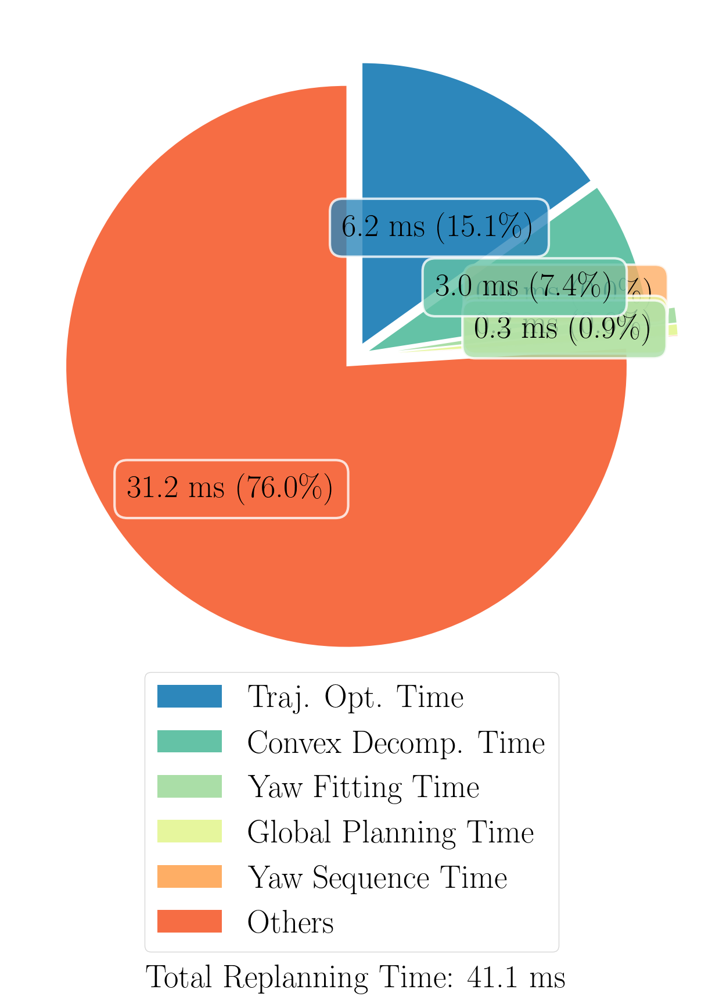

In [180]:
# Define custom colors for the pie chart
# custom_colors = ['#009392', '#398185', '#9CCB86', '#E9E29C', '#EEB479', '#E88471']
custom_colors = ["#F66D44", "#FEAE65", "#E6F69D", "#AADEA7", "#64C2A6", "#2D87BB"]

algorithms = ["dynus"]
envs = ["big_forest_high_res"]

# Get the data

for env in envs:

    for algorithm in algorithms:

        print("*******************************************************************")
        print("Algorithm: ", algorithm + " - " + env)
        print("*******************************************************************")

        input_folder_path = f"/media/kkondo/T7/dynus/tro_paper/single_agent_performance/{env}/csv/"
        # output_folder_path = f"/media/kkondo/T7/dynus/tro_paper/single_agent_performance/{env}/plots/"
        output_folder_path = f"/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/{env}/"
        os.makedirs(output_folder_path, exist_ok=True)

        float_data = get_data(input_folder_path, algorithm)
        float_data = filter_data(float_data)
        avg_data, min_data, max_data, std_data = get_metrics(float_data)

        for key in float_data:
        
            # Skip the very first line
            if key == 'Planner':
                continue

            print(key, avg_data[key], min_data[key], max_data[key], std_data[key])

        # Plot the pie chart for the algorithm with custom colors
        plot_replanning_time_composition(avg_data, output_folder_path, colors=custom_colors)

In [160]:
def plot_nested_pie_charts(avg_data, colors=None):
    """
    Plots a main pie chart showing the composition of total replanning time and a nested pie chart 
    breaking down Global Planning Time into its subcomponents.

    Parameters:
        avg_data (dict): A dictionary containing the average metrics for each key.
        colors (list of str): A list of colors to use for the pie charts.
    """
    # Extract total replanning time from the relevant components
    total_replanning_time = sum([
        avg_data[key] for key in avg_data if key in [
            "Global Planning Time [ms]",
            "CVX Decomposition Time [ms]",
            "Gurobi Time [ms]",
            "Yaw Sequence Time [ms]",
            "Yaw Fitting Time [ms]",
        ]
    ])

    # Main components contributing to total replanning time
    main_component_keys = [
        "Global Planning Time [ms]",
        "CVX Decomposition Time [ms]",
        "Gurobi Time [ms]",
        "Yaw Sequence Time [ms]",
        "Yaw Fitting Time [ms]",
    ]
    main_label_mapping = {
        "Global Planning Time [ms]": "Global Planning Time",
        "CVX Decomposition Time [ms]": "Convex Decomp. Time",
        "Gurobi Time [ms]": "Gurobi Time",
        "Yaw Sequence Time [ms]": "Yaw Sequence Time",
        "Yaw Fitting Time [ms]": "Yaw Fitting Time",
    }

    # Subcomponents of Global Planning Time
    subcomponent_keys = [
        "Static JPS Time [ms]",
        "Check Path Time [ms]",
        "Dynamic A* Time [ms]",
        "Recover Path Time [ms]",
    ]
    sub_label_mapping = {
        "Static JPS Time [ms]": "Static JPS",
        "Check Path Time [ms]": "Check Path",
        "Dynamic A* Time [ms]": "Dynamic A*",
        "Recover Path Time [ms]": "Recover Path",
    }

    # Main chart data
    main_components = [avg_data[key] for key in main_component_keys if key in avg_data]
    main_labels = [main_label_mapping[key] for key in main_component_keys if key in avg_data]
    main_percentages = [component / total_replanning_time * 100 for component in main_components]

    # Subchart data (Global Planning Time breakdown)
    sub_components = [avg_data[key] for key in subcomponent_keys if key in avg_data]
    sub_labels = [sub_label_mapping[key] for key in subcomponent_keys if key in avg_data]
    sub_total = sum(sub_components)
    sub_percentages = [component / sub_total * 100 for component in sub_components]

    # Default colors if none are provided
    if colors is None:
        colors = plt.cm.Paired.colors  # Default colormap
    main_colors = colors[:len(main_components)]
    sub_colors = colors[:len(sub_components)]

    # Create nested pie charts
    figsize_x = 20
    figsize_y = figsize_x / 1.618  # Golden ratio
    fig, axs = plt.subplots(1, 2, figsize=(figsize_x, figsize_y))

    # Main Pie Chart
    axs[0].pie(
        main_percentages,
        labels=main_labels,
        startangle=90,
        colors=main_colors,
        autopct=lambda pct: f"{pct:.1f}%\n({pct * total_replanning_time / 100:.2f} ms)",
        textprops={'fontproperties': font},
    )
    axs[0].set_title("Total Replanning Time Composition", fontproperties=font, pad=20)

    # Sub Pie Chart
    axs[1].pie(
        sub_percentages,
        labels=sub_labels,
        startangle=90,
        colors=sub_colors,
        autopct=lambda pct: f"{pct:.1f}%\n({pct * sub_total / 100:.2f} ms)",
        textprops={'fontproperties': font},
    )
    axs[1].set_title("Global Planning Time Breakdown", fontproperties=font, pad=20)

    # Adjust layout
    plt.tight_layout()
    plt.show()


In [162]:
import rclpy
import rosbag2_py
import numpy as np
import matplotlib.pyplot as plt
from rclpy.serialization import deserialize_message
from geometry_msgs.msg import Vector3
from std_msgs.msg import Header
from dynus_interfaces.msg import Goal  # Update this to the correct package where Goal is defined
from rosidl_runtime_py.utilities import get_message

def extract_goal_yaw_history(bag_path, topic_name="/NX01/goal"):
    """
    Extracts the yaw and corresponding time values from a ROS2 bag for the given topic.

    Parameters:
        bag_path (str): Path to the ROS2 bag.
        topic_name (str): Topic name to extract.

    Returns:
        tuple: A tuple of timestamps (relative to the first message) and yaw values.
    """
    # Initialize storage and converter
    storage_options = rosbag2_py.StorageOptions(uri=bag_path, storage_id="sqlite3")
    converter_options = rosbag2_py.ConverterOptions(
        input_serialization_format="cdr", output_serialization_format="cdr"
    )

    reader = rosbag2_py.SequentialReader()
    reader.open(storage_options, converter_options)

    # Get topics and types
    topics = reader.get_all_topics_and_types()
    topic_type = {topic.name: topic.type for topic in topics}

    if topic_name not in topic_type:
        print(f"Topic {topic_name} not found in bag: {bag_path}")
        return [], []

    # Deserialize message type
    msg_type = get_message(topic_type[topic_name])

    timestamps = []
    yaw_values = []

    # Read messages from the bag
    while reader.has_next():
        (topic, msg, t) = reader.read_next()
        if topic == topic_name:
            goal_msg = deserialize_message(msg, msg_type)
            yaw_values.append(goal_msg.yaw)
            timestamps.append(goal_msg.header.stamp.sec + goal_msg.header.stamp.nanosec * 1e-9)

    # Normalize timestamps to start from 0
    if timestamps:
        start_time = timestamps[0]
        timestamps = [t - start_time for t in timestamps]

    return timestamps, yaw_values

def plot_yaw_histories(bag1_path, bag2_path, labels, topic_name="/NX01/goal"):
    """
    Plots the yaw histories from two ROS2 bags.

    Parameters:
        bag1_path (str): Path to the first ROS2 bag.
        bag2_path (str): Path to the second ROS2 bag.
        labels (list of str): Labels for the two yaw histories.
        topic_name (str): Topic name to extract yaw values.
    """
    # Extract data from the bags
    timestamps1, yaw_values1 = extract_goal_yaw_history(bag1_path, topic_name)
    timestamps2, yaw_values2 = extract_goal_yaw_history(bag2_path, topic_name)

    # Plot yaw histories
    plt.figure(figsize=(12, 6))
    plt.plot(timestamps1, yaw_values1, label=labels[0], linewidth=2)
    plt.plot(timestamps2, yaw_values2, label=labels[1], linewidth=2, linestyle='--')
    plt.title("Yaw History", fontsize=16)
    plt.xlabel("Time (s)", fontsize=14)
    plt.ylabel("Yaw (rad)", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

image size:  (2679, 1877)
image size:  (3419, 1900)


/tmp/ipykernel_1726531/726894899.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()  # Adjust layout to prevent overlap


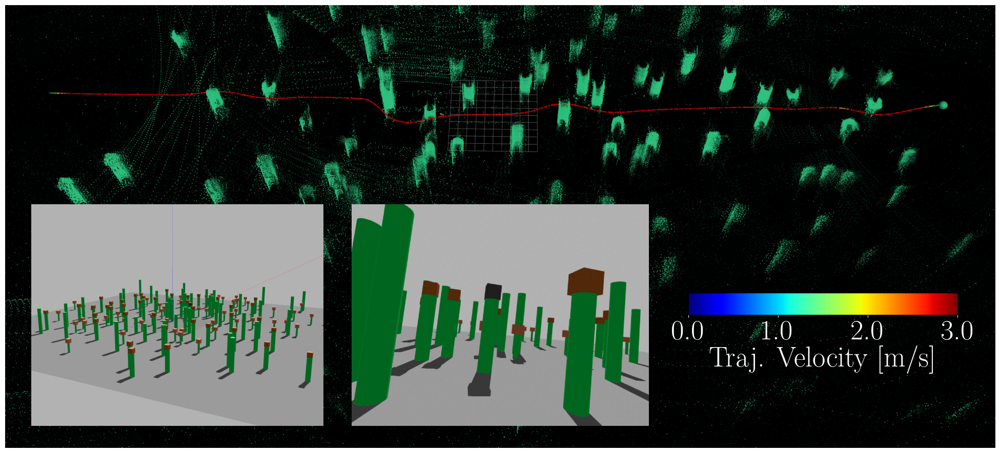

Combined image saved to /home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/static_forest3/static_forest3_combined.pdf


In [8]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar
import numpy as np
import fitz  # PyMuPDF for handling PDFs
from PIL import Image
import matplotlib.patches as patches

# Function to convert a single-page PDF to a PIL Image
def pdf_to_image(pdf_path, dpi=300):
    doc = fitz.open(pdf_path)
    page = doc[0]  # Assuming the PDF has only one page
    pix = page.get_pixmap(dpi=dpi)
    img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)
    return img

def plot_single_agent_performance_comined(image_paths, output_path, env_name):

    # Load images and handle PDF
    images = []
    for path in image_paths:
        if path.endswith('.pdf'):
            images.append(pdf_to_image(path))  # Convert PDF to image
        else:
            images.append(Image.open(path))  # Open image directly

    # Crop image 2
    image2 = Image.open(image_paths[1])
    print("image size: ", image2.size)

    if env_name == "static_forest3":
        crop_box = (0, 600, image2.size[0], 1800)  # Define the crop region (left, upper, right, lower)
    elif env_name == "dynamic_forest3":
        crop_box = (300, 700, image2.size[0] - 600, 1400)  # Define the crop region (left, upper, right, lower)
    elif env_name == "big_forest_high_res":
        crop_box = (300, 650, image2.size[0] - 400, 1400)  # Define the crop region (left, upper, right, lower)
    else:
        crop_box = (500, 700, image2.size[0] - 400, 1400)  # Define the crop region (left, upper, right, lower)
        
    image2_cropped = image2.crop(crop_box)

    # Crop image 1
    image1 = Image.open(image_paths[0])
    print("image size: ", image1.size)
    crop_box = (500, 0, 3000, 1900)  # Define the crop region (left, upper, right, lower)
    image1_cropped = image1.crop(crop_box)

    # Replace the original images with the cropped versions
    images[0] = image1_cropped
    images[1] = image2_cropped  # Replace the original image with the cropped version


    # Dummy data for shared colorbar (replace with real data if needed)
    dummy_data = np.linspace(0, 3, 100).reshape(10, 10)  # Example data

    # Create figure and GridSpec
    figure_size_x = 35
    figure_size_y = figure_size_x / 1.618  # Golden ratio
    fig = plt.figure(figsize=(figure_size_x, figure_size_y))
    # gs = GridSpec(2, 3, height_ratios=[2, 1], figure=fig)
    # gs.update(wspace=-0.3)  # Reduce horizontal spacing

    ax2 = fig.add_axes([0.0, 0.6, 1.0, 0.4])  # [left, bottom, width, heighth

    # Get the bounding box of ax2 to position the colorbar precisely
    pos_ax2 = ax2.get_position()  # Get position of ax2 in figure coordinates
    cbar_ax2 = fig.add_axes([
        pos_ax2.x0 + 0.605,           # Left position (same as ax2)
        pos_ax2.y0 + 0.12,    # Bottom position (slightly below ax2)
        # pos_ax2.width,        # Same width as ax2
        0.15,        # Same width as ax2
        0.02,                 # Height of the colorbar
    ])

    im_cbar = ax2.imshow(dummy_data, cmap='jet')  # Replace with real data if available
    ax2.imshow(images[1])  # Second image
    ax2.axis('off')

    cbar = fig.colorbar(im_cbar, cax=cbar_ax2, orientation='horizontal')
    cbar.ax.set_facecolor('white')  # Set the background color of the colorbar
    cbar.set_label("Traj. Velocity [m/s]", fontproperties=font, labelpad=0, color='white')
    cbar.set_ticks([0.0, 1.0, 2.0, 3.0])
    cbar.ax.set_xticklabels([0.0, 1.0, 2.0, 3.0], fontproperties=font)
    cbar.ax.xaxis.set_tick_params(color='white', labelcolor='white')

    # Add the simulation image on the top-left (Image 1)
    ax1 = fig.add_axes([0.22, 0.62, 0.2, 0.2])
    ax1.imshow(images[0])  # First image
    ax1.axis('off')
    
    # Add the camera view image on the bottom-left (Image 3)
    ax3 = fig.add_axes([0.4, 0.62, 0.2, 0.2])
    ax3.imshow(images[2])  # Third image
    ax3.axis('off')

    # Save the combined image to a file
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.savefig(output_path, 
                format='pdf',
                bbox_inches='tight',
                dpi=300)  # Save as high-resolution PNG
    plt.show()

    print(f"Combined image saved to {output_path}")

# Paths to images (include the PDF path)

env_name = "static_forest3"
# env_name = "dynamic_forest3"
# env_name = "big_forest_high_res"

base_path = "/home/kkondo/paper_writing/DYNUS_paper/"

image_paths = [
    base_path + f"figures/single_agent_performance/{env_name}/{env_name}_gazebo.png",
    base_path + f"figures/single_agent_performance/{env_name}/single_agent_performance_{env_name}_path.png",
    base_path + f"figures/single_agent_performance/{env_name}/single_agent_performance_{env_name}_camera.png",
    base_path + f"figures/single_agent_performance/{env_name}/replanning_time_composition.pdf",
]

output_path = f"/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/{env_name}/{env_name}_combined.pdf"

# make directory
os.makedirs(f"/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/{env_name}/", exist_ok=True)

plot_single_agent_performance_comined(image_paths, output_path, env_name)


image size:  (2679, 1877)
image size:  (3504, 1946)


/tmp/ipykernel_11535/1922195993.py:97: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()  # Adjust layout to prevent overlap


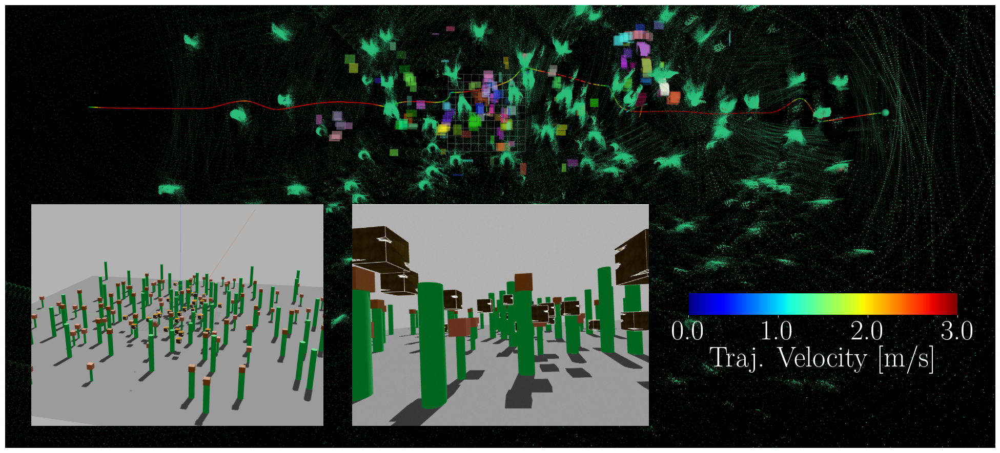

Combined image saved to /home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/dynamic_forest3/dynamic_forest3_combined.pdf


In [5]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar
import numpy as np
import fitz  # PyMuPDF for handling PDFs
from PIL import Image
import matplotlib.patches as patches

# Function to convert a single-page PDF to a PIL Image
def pdf_to_image(pdf_path, dpi=300):
    doc = fitz.open(pdf_path)
    page = doc[0]  # Assuming the PDF has only one page
    pix = page.get_pixmap(dpi=dpi)
    img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)
    return img

def plot_single_agent_performance_comined(image_paths, output_path, env_name):

    # Load images and handle PDF
    images = []
    for path in image_paths:
        if path.endswith('.pdf'):
            images.append(pdf_to_image(path))  # Convert PDF to image
        else:
            images.append(Image.open(path))  # Open image directly

    # Crop image 2
    image2 = Image.open(image_paths[1])
    print("image size: ", image2.size)

    if env_name == "static_forest3":
        crop_box = (0, 600, image2.size[0], 1800)  # Define the crop region (left, upper, right, lower)
    elif env_name == "dynamic_forest3":
        crop_box = (0, 500, image2.size[0], 1700)  # Define the crop region (left, upper, right, lower)
    elif env_name == "big_forest_high_res":
        crop_box = (300, 650, image2.size[0] - 400, 1400)  # Define the crop region (left, upper, right, lower)
    else:
        crop_box = (500, 700, image2.size[0] - 400, 1400)  # Define the crop region (left, upper, right, lower)
        
    image2_cropped = image2.crop(crop_box)

    # Crop image 1
    image1 = Image.open(image_paths[0])
    print("image size: ", image1.size)
    crop_box = (500, 0, 3000, 1900)  # Define the crop region (left, upper, right, lower)
    image1_cropped = image1.crop(crop_box)

    # Replace the original images with the cropped versions
    images[0] = image1_cropped
    images[1] = image2_cropped  # Replace the original image with the cropped version


    # Dummy data for shared colorbar (replace with real data if needed)
    dummy_data = np.linspace(0, 3, 100).reshape(10, 10)  # Example data

    # Create figure and GridSpec
    figure_size_x = 35
    figure_size_y = figure_size_x / 1.618  # Golden ratio
    fig = plt.figure(figsize=(figure_size_x, figure_size_y))
    # gs = GridSpec(2, 3, height_ratios=[2, 1], figure=fig)
    # gs.update(wspace=-0.3)  # Reduce horizontal spacing

    ax2 = fig.add_axes([0.0, 0.6, 1.0, 0.4])  # [left, bottom, width, heighth

    # Get the bounding box of ax2 to position the colorbar precisely
    pos_ax2 = ax2.get_position()  # Get position of ax2 in figure coordinates
    cbar_ax2 = fig.add_axes([
        pos_ax2.x0 + 0.605,           # Left position (same as ax2)
        pos_ax2.y0 + 0.12,    # Bottom position (slightly below ax2)
        # pos_ax2.width,        # Same width as ax2
        0.15,        # Same width as ax2
        0.02,                 # Height of the colorbar
    ])

    im_cbar = ax2.imshow(dummy_data, cmap='jet')  # Replace with real data if available
    ax2.imshow(images[1])  # Second image
    ax2.axis('off')

    cbar = fig.colorbar(im_cbar, cax=cbar_ax2, orientation='horizontal')
    cbar.ax.set_facecolor('white')  # Set the background color of the colorbar
    cbar.set_label("Traj. Velocity [m/s]", fontproperties=font, labelpad=0, color='white')
    cbar.set_ticks([0.0, 1.0, 2.0, 3.0])
    cbar.ax.set_xticklabels([0.0, 1.0, 2.0, 3.0], fontproperties=font)
    cbar.ax.xaxis.set_tick_params(color='white', labelcolor='white')

    # Add the simulation image on the top-left (Image 1)
    ax1 = fig.add_axes([0.22, 0.62, 0.2, 0.2])
    ax1.imshow(images[0])  # First image
    ax1.axis('off')
    
    # Add the camera view image on the bottom-left (Image 3)
    ax3 = fig.add_axes([0.4, 0.62, 0.2, 0.2])
    ax3.imshow(images[2])  # Third image
    ax3.axis('off')

    # Save the combined image to a file
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.savefig(output_path, 
                format='pdf',
                bbox_inches='tight',
                dpi=300)  # Save as high-resolution PNG
    plt.show()

    print(f"Combined image saved to {output_path}")

# Paths to images (include the PDF path)

env_name = "dynamic_forest3"
# env_name = "big_forest_high_res"

base_path = "/home/kkondo/paper_writing/DYNUS_paper/"

image_paths = [
    base_path + f"figures/single_agent_performance/{env_name}/{env_name}_gazebo.png",
    base_path + f"figures/single_agent_performance/{env_name}/single_agent_performance_{env_name}_path.png",
    base_path + f"figures/single_agent_performance/{env_name}/single_agent_performance_{env_name}_camera.png",
    base_path + f"figures/single_agent_performance/{env_name}/replanning_time_composition.pdf",
]

output_path = f"/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/{env_name}/{env_name}_combined.pdf"

# make directory
os.makedirs(f"/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/{env_name}/", exist_ok=True)

plot_single_agent_performance_comined(image_paths, output_path, env_name)

image size:  (2680, 1865)
image size:  (3419, 1900)


/tmp/ipykernel_2164431/1954501892.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()  # Adjust layout to prevent overlap


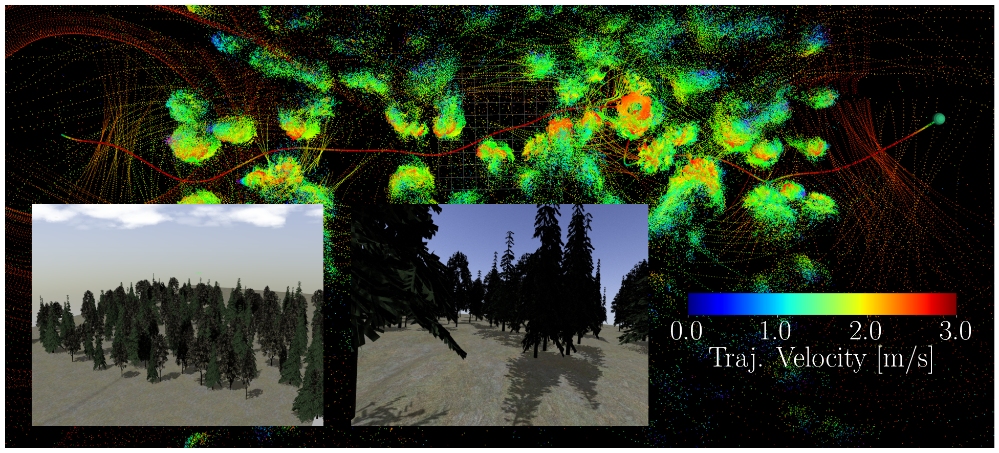

Combined image saved to /home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/big_forest_high_res/big_forest_high_res_combined.pdf


In [20]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar
import numpy as np
import fitz  # PyMuPDF for handling PDFs
from PIL import Image
import matplotlib.patches as patches

# Function to convert a single-page PDF to a PIL Image
def pdf_to_image(pdf_path, dpi=300):
    doc = fitz.open(pdf_path)
    page = doc[0]  # Assuming the PDF has only one page
    pix = page.get_pixmap(dpi=dpi)
    img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)
    return img

def plot_single_agent_performance_comined(image_paths, output_path, env_name):

    # Load images and handle PDF
    images = []
    for path in image_paths:
        if path.endswith('.pdf'):
            images.append(pdf_to_image(path))  # Convert PDF to image
        else:
            images.append(Image.open(path))  # Open image directly

    # Crop image 2
    image2 = Image.open(image_paths[1])
    print("image size: ", image2.size)

    if env_name == "static_forest3":
        crop_box = (0, 600, image2.size[0], 1800)  # Define the crop region (left, upper, right, lower)
    elif env_name == "dynamic_forest3":
        crop_box = (0, 500, image2.size[0], 1700)  # Define the crop region (left, upper, right, lower)
    elif env_name == "big_forest_high_res":
        crop_box = (0, 600, image2.size[0], 1800)  # Define the crop region (left, upper, right, lower)
    else:
        crop_box = (500, 700, image2.size[0] - 400, 1400)  # Define the crop region (left, upper, right, lower)
        
    image2_cropped = image2.crop(crop_box)

    # Crop image 1
    image1 = Image.open(image_paths[0])
    print("image size: ", image1.size)
    crop_box = (500, 0, 3000, 1900)  # Define the crop region (left, upper, right, lower)
    image1_cropped = image1.crop(crop_box)

    # Replace the original images with the cropped versions
    images[0] = image1_cropped
    images[1] = image2_cropped  # Replace the original image with the cropped version


    # Dummy data for shared colorbar (replace with real data if needed)
    dummy_data = np.linspace(0, 3, 100).reshape(10, 10)  # Example data
    dummy_data2 = np.linspace(0, 8, 100).reshape(10, 10)  # Example data

    # Create figure and GridSpec
    figure_size_x = 35
    figure_size_y = figure_size_x / 1.618  # Golden ratio
    fig = plt.figure(figsize=(figure_size_x, figure_size_y))
    # gs = GridSpec(2, 3, height_ratios=[2, 1], figure=fig)
    # gs.update(wspace=-0.3)  # Reduce horizontal spacing

    ax2 = fig.add_axes([0.0, 0.6, 1.0, 0.4])  # [left, bottom, width, heighth

    # Get the bounding box of ax2 to position the colorbar precisely
    pos_ax2 = ax2.get_position()  # Get position of ax2 in figure coordinates
    cbar_ax2 = fig.add_axes([
        pos_ax2.x0 + 0.605,           # Left position (same as ax2)
        pos_ax2.y0 + 0.12,    # Bottom position (slightly below ax2)
        # pos_ax2.width,        # Same width as ax2
        0.15,        # Same width as ax2
        0.02,                 # Height of the colorbar
    ])
    # cbar_ax22 = fig.add_axes([
    #     pos_ax2.x0 + 0.605,           # Left position (same as ax2)
    #     pos_ax2.y0 + 0.18,    # Bottom position (slightly below ax2)
    #     # pos_ax2.width,        # Same width as ax2
    #     0.15,        # Same width as ax2
    #     0.02,                 # Height of the colorbar
    # ])

    im_cbar = ax2.imshow(dummy_data, cmap='jet')  # Replace with real data if available
    # im_cbar2 = ax2.imshow(dummy_data2, cmap='jet_r')  # Replace with real data if available
    ax2.imshow(images[1])  # Second image
    ax2.axis('off')

    cbar = fig.colorbar(im_cbar, cax=cbar_ax2, orientation='horizontal')
    cbar.ax.set_facecolor('white')  # Set the background color of the colorbar
    cbar.set_label("Traj. Velocity [m/s]", fontproperties=font, labelpad=0, color='white')
    cbar.set_ticks([0.0, 1.0, 2.0, 3.0])
    cbar.ax.set_xticklabels([0.0, 1.0, 2.0, 3.0], fontproperties=font)
    cbar.ax.xaxis.set_tick_params(color='white', labelcolor='white')

    # cbar2 = fig.colorbar(im_cbar2, cax=cbar_ax22, orientation='horizontal')
    # cbar2.ax.set_facecolor('white')  # Set the background color of the colorbar
    # cbar2.set_label("Point Cloud Height [m]", fontproperties=font, labelpad=0, color='white')
    # cbar2.set_ticks([0.0, 2.0, 4.0, 6.0, 8.0])
    # cbar2.ax.set_xticklabels([0.0, 2.0, 4.0, 6.0, 8.0], fontproperties=font)
    # cbar2.ax.xaxis.set_tick_params(color='white', labelcolor='white')

    # Add the simulation image on the top-left (Image 1)
    ax1 = fig.add_axes([0.22, 0.62, 0.2, 0.2])
    ax1.imshow(images[0])  # First image
    ax1.axis('off')
    
    # Add the camera view image on the bottom-left (Image 3)
    ax3 = fig.add_axes([0.4, 0.62, 0.2, 0.2])
    ax3.imshow(images[2])  # Third image
    ax3.axis('off')

    # Save the combined image to a file
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.savefig(output_path, 
                format='pdf',
                bbox_inches='tight',
                dpi=300)  # Save as high-resolution PNG
    plt.show()

    print(f"Combined image saved to {output_path}")

# Paths to images (include the PDF path)

env_name = "big_forest_high_res"

base_path = "/home/kkondo/paper_writing/DYNUS_paper/"

image_paths = [
    base_path + f"figures/single_agent_performance/{env_name}/{env_name}_gazebo.png",
    base_path + f"figures/single_agent_performance/{env_name}/single_agent_performance_{env_name}_path0.png",
    base_path + f"figures/single_agent_performance/{env_name}/single_agent_performance_{env_name}_camera.png",
    base_path + f"figures/single_agent_performance/{env_name}/replanning_time_composition.pdf",
]

output_path = f"/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/{env_name}/{env_name}_combined.pdf"

# make directory
os.makedirs(f"/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/{env_name}/", exist_ok=True)

plot_single_agent_performance_comined(image_paths, output_path, env_name)

image size:  (2405, 1881)
image size:  (1824, 1564)


/tmp/ipykernel_981837/2605268247.py:101: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()  # Adjust layout to prevent overlap


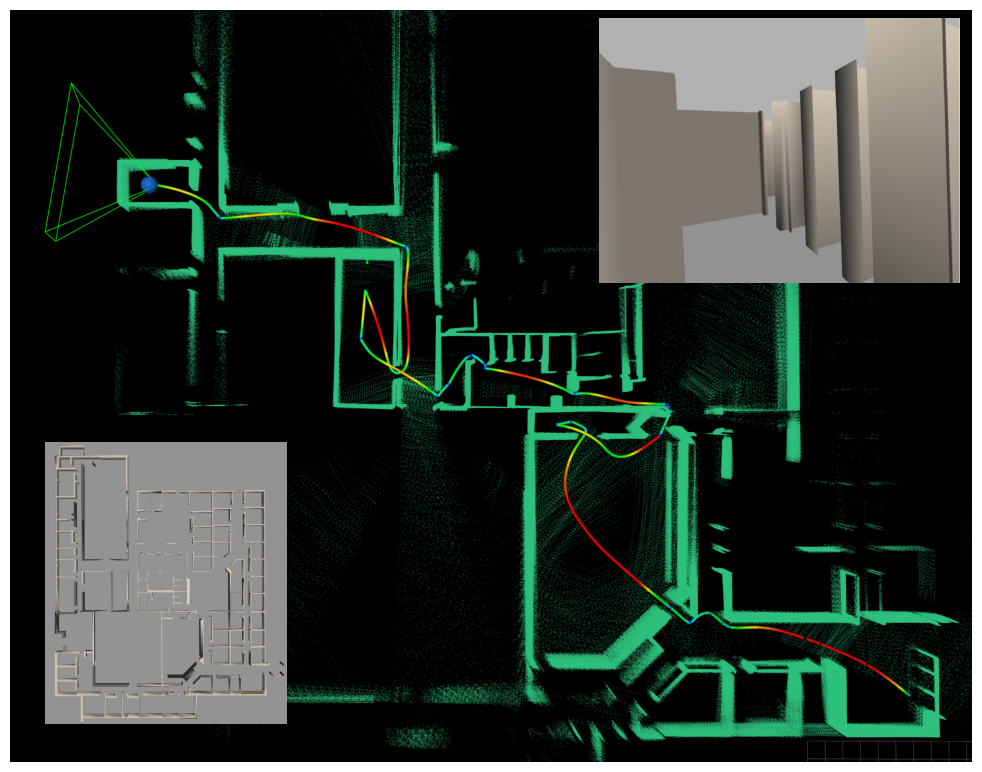

Combined image saved to /home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/office/office_combined.pdf


In [18]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar
import numpy as np
import fitz  # PyMuPDF for handling PDFs
from PIL import Image
import matplotlib.patches as patches

# Function to convert a single-page PDF to a PIL Image
def pdf_to_image(pdf_path, dpi=300):
    doc = fitz.open(pdf_path)
    page = doc[0]  # Assuming the PDF has only one page
    pix = page.get_pixmap(dpi=dpi)
    img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)
    return img

def plot_single_agent_performance_comined(image_paths, output_path, env_name):

    # Load images and handle PDF
    images = []
    for path in image_paths:
        if path.endswith('.pdf'):
            images.append(pdf_to_image(path))  # Convert PDF to image
        else:
            images.append(Image.open(path))  # Open image directly

    # Crop image 2
    image2 = Image.open(image_paths[1])
    print("image size: ", image2.size)

    if env_name == "static_forest3":
        crop_box = (0, 600, image2.size[0], 1800)  # Define the crop region (left, upper, right, lower)
    elif env_name == "dynamic_forest3":
        crop_box = (0, 500, image2.size[0], 1700)  # Define the crop region (left, upper, right, lower)
    elif env_name == "big_forest_high_res":
        crop_box = (0, 600, image2.size[0], 1800)  # Define the crop region (left, upper, right, lower)
    elif env_name == "office":
        crop_box = (0, 0, image2.size[0], image2.size[1])  # Define the crop region (left, upper, right, lower)
        
    image2_cropped = image2.crop(crop_box)

    # Crop image 1
    image1 = Image.open(image_paths[0])
    print("image size: ", image1.size)
    crop_box = (0, 0, image1.size[0], image1.size[1])  # Define the crop region (left, upper, right, lower)
    image1_cropped = image1.crop(crop_box)

    # Rotate image 1 90 degrees counter-clockwise
    image1_cropped = image1_cropped.rotate(90, expand=True)

    # Replace the original images with the cropped versions
    images[0] = image1_cropped
    images[1] = image2_cropped  # Replace the original image with the cropped version

    # Dummy data for shared colorbar (replace with real data if needed)
    dummy_data = np.linspace(0, 3, 100).reshape(10, 10)  # Example data

    # Create figure and GridSpec
    figure_size_x = image2.size[0] / 100
    figure_size_y = image2.size[1] / 100  
    fig = plt.figure(figsize=(figure_size_x, figure_size_y))
    # gs = GridSpec(2, 3, height_ratios=[2, 1], figure=fig)
    # gs.update(wspace=-0.3)  # Reduce horizontal spacing

    ax2 = fig.add_axes([0.0, 0.6, 1.0, 0.4])  # [left, bottom, width, heighth

    # Get the bounding box of ax2 to position the colorbar precisely
    pos_ax2 = ax2.get_position()  # Get position of ax2 in figure coordinates
    # cbar_ax2 = fig.add_axes([
    #     pos_ax2.x0 + 0.315,           # Left position (same as ax2)
    #     pos_ax2.y0 + 0.05,    # Bottom position (slightly below ax2)
    #     # pos_ax2.width,        # Same width as ax2
    #     0.1,        # Same width as ax2
    #     0.02,                 # Height of the colorbar
    # ])

    # im_cbar = ax2.imshow(dummy_data, cmap='jet')  # Replace with real data if available
    ax2.imshow(images[1])  # Second image
    ax2.axis('off')

    # cbar = fig.colorbar(im_cbar, cax=cbar_ax2, orientation='horizontal')
    # cbar.ax.set_facecolor('white')  # Set the background color of the colorbar
    # # cbar.set_label("Traj. Velocity [m/s]", fontproperties=font, labelpad=0, color='white')
    # ax2.text(0.4, 0.12, "[m/s]", ha='center', va='top', transform=ax2.transAxes, fontproperties=font, color='white')
    # cbar.set_ticks([0.0, 1.0, 2.0, 3.0])
    # cbar.ax.set_xticklabels([0.0, 1.0, 2.0, 3.0], fontproperties=font)
    # cbar.ax.xaxis.set_tick_params(color='white', labelcolor='white')

    # Gazebo image
    # ax1 = fig.add_axes([0.29, 0.68, 0.15, 0.15]) # with color bar
    ax1 = fig.add_axes([0.29, 0.62, 0.15, 0.15])
    ax1.imshow(images[0])  # First image
    ax1.axis('off')
    
    # Camera image
    ax3 = fig.add_axes([0.545, 0.85, 0.15, 0.15])
    ax3.imshow(images[2])  # Third image
    ax3.axis('off')

    # Save the combined image to a file
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.savefig(output_path, 
                format='pdf',
                bbox_inches='tight',
                dpi=300)  # Save as high-resolution PNG
    plt.show()

    print(f"Combined image saved to {output_path}")

# Paths to images (include the PDF path)

env_name = "office"

base_path = "/home/kkondo/paper_writing/DYNUS_paper/"

image_paths = [
    base_path + f"figures/single_agent_performance/{env_name}/{env_name}_gazebo.png",
    base_path + f"figures/single_agent_performance/{env_name}/single_agent_{env_name}_test1_path.png",
    base_path + f"figures/single_agent_performance/{env_name}/single_agent_performance_{env_name}_camera.png"
]

output_path = f"/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/{env_name}/{env_name}_combined.pdf"

# make directory
os.makedirs(f"/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/{env_name}/", exist_ok=True)

plot_single_agent_performance_comined(image_paths, output_path, env_name)

image size:  (2399, 1855)
image size:  (2399, 1855)
image size:  (2399, 1855)


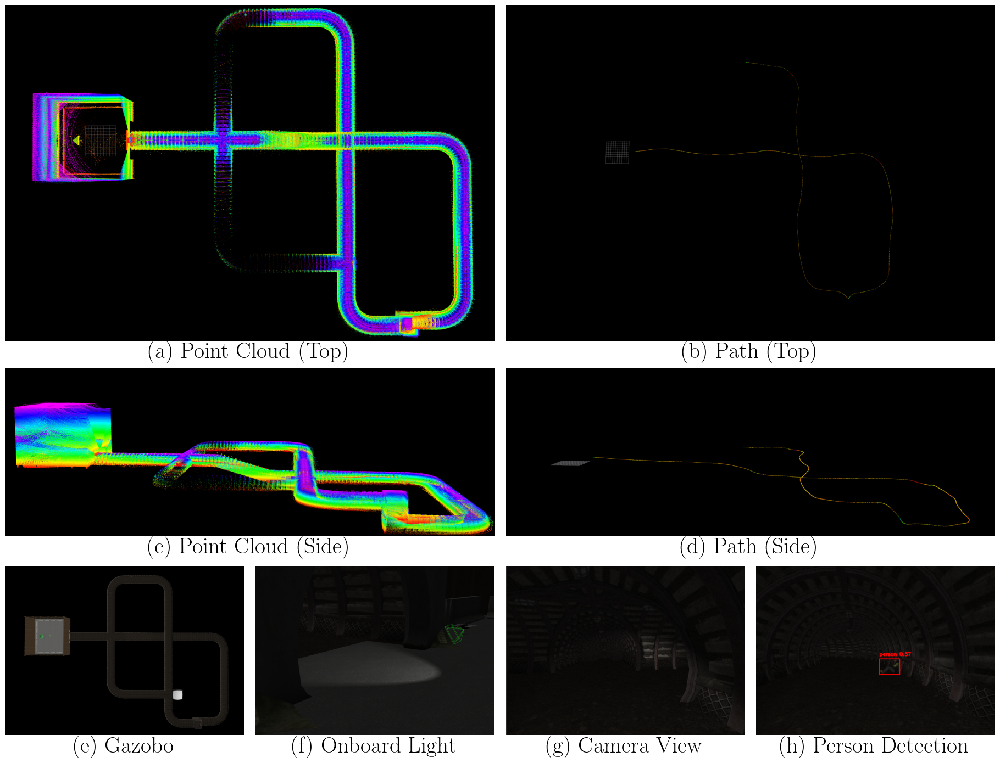

In [47]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from PIL import Image
import numpy as np

# Font settings
font4cave = font_manager.FontProperties()
font4cave.set_family('serif')
plt.rcParams.update({"text.usetex": True})
plt.rcParams["font.family"] = "Times New Roman"
font4cave.set_size(30)

# Function to resize an image while keeping the aspect ratio
def resize_to_width(image, target_width):
    aspect_ratio = image.height / image.width
    new_height = int(target_width * aspect_ratio)
    return image.resize((target_width, new_height), Image.Resampling.LANCZOS)

# base path
base_path = "/home/kkondo/paper_writing/DYNUS_paper/figures/single_agent_performance/cave"

# Load example images (replace with actual paths)
image_paths = [
    "single_agent_performance_cave_pc_top.png", "single_agent_performance_cave_path_top.png", 
    "single_agent_performance_cave_pc_side.png", "single_agent_performance_cave_path_side.png",
    "cave_gazebo.png", "single_agent_performance_cave_spotlight.png", "single_agent_performance_cave_camera.png", "single_agent_performance_cave_person_detection.png"
]

# Text labels for the images
labels = [
    "(a) Point Cloud (Top)", "(b) Path (Top)", "(c) Point Cloud (Side)", "(d) Path (Side)",
    "(e) Gazobo", "(f) Onboard Light", "(g) Camera View", "(h) Person Detection"
]

# Add base path to image paths
image_paths = [base_path + "/" + path for path in image_paths]

# Load images
images = [Image.open(path) for path in image_paths]

# Create figure and gridspec layout
figure_size_x = 20
figure_size_y = figure_size_x * 1.618 - 16.2 # Golden ratio
fig = plt.figure(figsize=(figure_size_x, figure_size_y))
gs = GridSpec(3, 4, figure=fig, height_ratios=[1, 1, 0.6])  # Two rows of 2, one row of 4

# Get image 3's size and resize image 1 and 2 to match
image3 = Image.open(image_paths[2])
target_size = image3.size  # Get the size of image3

# First row (2 images)

# crop image 1 and 2
image1 = Image.open(image_paths[0])
image2 = Image.open(image_paths[1])
print("image size: ", image1.size)
crop_box = (0, 150, image1.size[0], 1800)  # Define the crop region (left, upper, right, lower)
images[0] = image1.crop(crop_box)
images[1] = image2.crop(crop_box)

# resize image 1 and 2 to match image 3's width but keep the aspect ratio
for i in range(2):
    images[i] = resize_to_width(images[i], target_size[0])

ax1 = fig.add_subplot(gs[0, 0:2])  # 1st row, first 2 columns
ax1.imshow(images[0])
ax1.axis('off')
ax1.text(0.5, -0.05, labels[0], transform=ax1.transAxes, ha='center', fontproperties=font4cave)

ax2 = fig.add_subplot(gs[0, 2:4])  # 1st row, last 2 columns
ax2.imshow(images[1])
ax2.axis('off')
ax2.text(0.5, -0.05, labels[1], transform=ax2.transAxes, ha='center', fontproperties=font4cave)

# Second row (2 images)

## crop image 3 and 4
image3 = Image.open(image_paths[2])
image4 = Image.open(image_paths[3])
print("image size: ", images[2].size)
crop_box = (300, 700, image3.size[0]-200, image3.size[1] - 500)  # Define the crop region (left, upper, right, lower)

image3_cropped = image3.crop(crop_box)
image4_cropped = image4.crop(crop_box)

ax3 = fig.add_subplot(gs[1, 0:2])  # 2nd row, first 2 columns
ax3.imshow(image3_cropped)
ax3.axis('off')
ax3.text(0.5, -0.1, labels[2], transform=ax3.transAxes, ha='center', fontproperties=font4cave)

ax4 = fig.add_subplot(gs[1, 2:4])  # 2nd row, last 2 columns
ax4.imshow(image4_cropped)
ax4.axis('off')
ax4.text(0.5, -0.1, labels[3], transform=ax4.transAxes, ha='center', fontproperties=font4cave)

# Third row (4 images)

# Crop image 5
image5 = Image.open(image_paths[4])
print("image size: ", image5.size)
crop_box = (100, 300, image5.size[0]-100, image5.size[1])  # Define the crop region (left, upper, right, lower)
images[4] = image5.crop(crop_box)

# Resize last four images to match the size of image5
target_size = images[4].size  # Get the size of image5
for i in range(4, 8):
    images[i] = images[i].resize(target_size, Image.Resampling.LANCZOS)

for i in range(4):
    ax = fig.add_subplot(gs[2, i])  # 3rd row, spread across all columns
    ax.imshow(images[i + 4])
    ax.axis('off')
    ax.text(0.5, -0.1, labels[i + 4], transform=ax.transAxes, ha='center', fontproperties=font4cave)

# Adjust layout and save the figure
# plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=-0.35, wspace=0.05)
output_path = base_path + "/cave_combined.pdf"
plt.savefig(output_path, format='pdf', bbox_inches='tight', dpi=300)  # Save as high-resolution PNG
plt.show()


/tmp/ipykernel_981837/1413800295.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()  # Adjust layout to prevent overlap


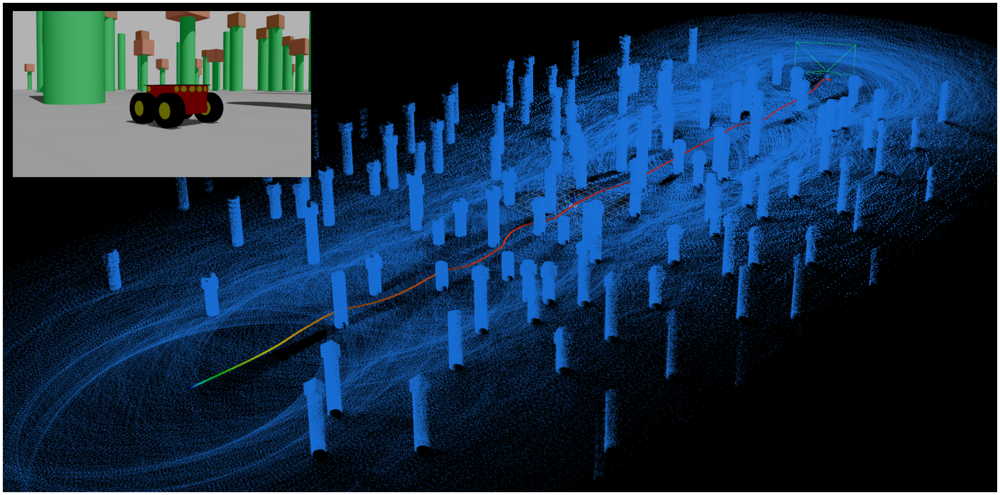

Combined image saved to /home/kkondo/paper_writing/DYNUS_paper/figures/ground_robot/ground_robot_combined.png


In [8]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar
import numpy as np
import fitz  # PyMuPDF for handling PDFs
from PIL import Image
import matplotlib.patches as patches

# Function to convert a single-page PDF to a PIL Image
def resize_to_width(image, target_width):
    aspect_ratio = image.height / image.width
    new_height = int(target_width * aspect_ratio)
    return image.resize((target_width, new_height), Image.Resampling.LANCZOS)

def plot_single_agent_performance_comined(image_paths, output_path, env_name):

    # Load images and handle PDF
    images = []
    for path in image_paths:
        if path.endswith('.pdf'):
            images.append(pdf_to_image(path))  # Convert PDF to image
        else:
            images.append(Image.open(path))  # Open image directly

    # Resize image[1] to make it 20$ of the width of image[0]
    images[1] = resize_to_width(images[1], images[0].width // 4)

    # Create figure and GridSpec
    figure_size_x = 35
    figure_size_y = figure_size_x / 1.618  # Golden ratio
    fig = plt.figure(figsize=(figure_size_x, figure_size_y))

    # Add the simulation image (main image)
    ax1 = fig.add_axes([0.0, 0.0, 1.0, 1.0])
    ax1.imshow(images[0])  # First image
    ax1.axis('off')
    
    # Add the gazebo image on the top-left (Image 1)
    ax2 = fig.add_axes([0.01, 0.6, 0.3, 0.3])
    ax2.imshow(images[1])  # Third image
    ax2.axis('off')

    # Save the combined image to a file
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.savefig(output_path, 
                format='png',
                bbox_inches='tight',
                dpi=300)  # Save as high-resolution PNG
    plt.show()

    print(f"Combined image saved to {output_path}")

# Paths to images (include the PDF path)

env_name = "ground_robot"

base_path = "/home/kkondo/paper_writing/DYNUS_paper/"

image_paths = [
    base_path + f"figures/{env_name}/{env_name}_path2.png",
    base_path + f"figures/{env_name}/red_rover_gazebo.png",
]

output_path = f"/home/kkondo/paper_writing/DYNUS_paper/figures/{env_name}/{env_name}_combined.png"

# make directory
# os.makedirs(f"/home/kkondo/paper_writing/DYNUS_paper/figures/{env_name}/", exist_ok=True)

plot_single_agent_performance_comined(image_paths, output_path, env_name)

/tmp/ipykernel_981837/1486834420.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()  # Adjust layout to prevent overlap


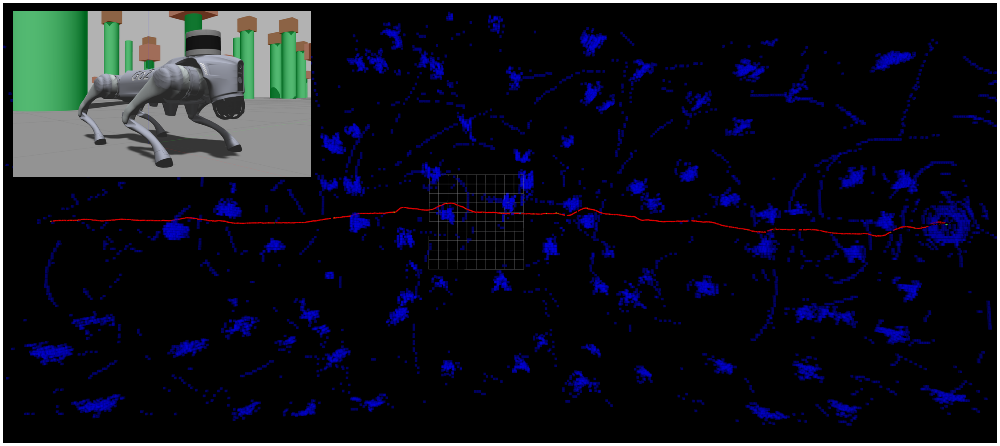

Combined image saved to /home/kkondo/paper_writing/DYNUS_paper/figures/quadruped/quadruped_combined.png


In [9]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colorbar import Colorbar
import numpy as np
import fitz  # PyMuPDF for handling PDFs
from PIL import Image
import matplotlib.patches as patches

# Function to convert a single-page PDF to a PIL Image
def resize_to_width(image, target_width):
    aspect_ratio = image.height / image.width
    new_height = int(target_width * aspect_ratio)
    return image.resize((target_width, new_height), Image.Resampling.LANCZOS)

def plot_single_agent_performance_comined(image_paths, output_path, env_name):

    # Load images and handle PDF
    images = []
    for path in image_paths:
        if path.endswith('.pdf'):
            images.append(pdf_to_image(path))  # Convert PDF to image
        else:
            images.append(Image.open(path))  # Open image directly

    # Resize image[1] to make it 20$ of the width of image[0]
    images[1] = resize_to_width(images[1], images[0].width // 4)

    # Create figure and GridSpec
    figure_size_x = 35
    figure_size_y = figure_size_x / 1.618  # Golden ratio
    fig = plt.figure(figsize=(figure_size_x, figure_size_y))

    # Add the simulation image (main image)
    ax1 = fig.add_axes([0.0, 0.0, 1.0, 1.0])
    ax1.imshow(images[0])  # First image
    ax1.axis('off')
    
    # Add the gazebo image on the top-left (Image 1)
    ax2 = fig.add_axes([0.01, 0.56, 0.3, 0.3])
    ax2.imshow(images[1])  # Third image
    ax2.axis('off')

    # Save the combined image to a file
    plt.tight_layout()  # Adjust layout to prevent overlap
    plt.savefig(output_path, 
                format='png',
                bbox_inches='tight',
                dpi=300)  # Save as high-resolution PNG
    plt.show()

    print(f"Combined image saved to {output_path}")

# Paths to images (include the PDF path)

env_name = "quadruped"

base_path = "/home/kkondo/paper_writing/DYNUS_paper/"

image_paths = [
    base_path + f"figures/{env_name}/{env_name}_rviz.png",
    base_path + f"figures/{env_name}/{env_name}_gazebo.png",
]

output_path = f"/home/kkondo/paper_writing/DYNUS_paper/figures/{env_name}/{env_name}_combined.png"

# make directory
# os.makedirs(f"/home/kkondo/paper_writing/DYNUS_paper/figures/{env_name}/", exist_ok=True)

plot_single_agent_performance_comined(image_paths, output_path, env_name)